# Importing Necessary Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from pandas import Series,DataFrame
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Functions used later in the program

In [2]:
def dis_scatter(x,y):
    fig = px.scatter_matrix(x,dimensions=y,color=x["Rating_Labels"])
    fig.update_traces(diagonal_visible=False)
    fig.show()

# Reading The file and describing the Data

In [3]:
data=pd.read_csv("epi_r.csv")

In [4]:
data.describe()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
count,20052.000000,1.593500e+04,15890.000000,1.586900e+04,1.593300e+04,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,...,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000
mean,3.714467,6.322958e+03,100.160793,3.468775e+02,6.225975e+03,0.000299,0.000050,0.000848,0.001346,0.000349,...,0.001247,0.026332,0.000050,0.000299,0.014861,0.000150,0.000349,0.001396,0.000948,0.022741
std,1.340829,3.590460e+05,3840.318527,2.045611e+04,3.333182e+05,0.017296,0.007062,0.029105,0.036671,0.018681,...,0.035288,0.160123,0.007062,0.017296,0.121001,0.012231,0.018681,0.037343,0.030768,0.149080
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,1.980000e+02,3.000000,7.000000e+00,8.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.375000,3.310000e+02,8.000000,1.700000e+01,2.940000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.375000,5.860000e+02,27.000000,3.300000e+01,7.110000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,3.011122e+07,236489.000000,1.722763e+06,2.767511e+07,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Finding Duplicates and Removing them

In [5]:
no_of_duplicates=data.duplicated().sum()
print("Number of dupliacte records in the dataset are {}".format(no_of_duplicates))
data.drop_duplicates(inplace=True)
no_of_duplicates=data.duplicated().sum()
print("Number of duplicate records in the dataset after removing duplicates are {}".format(no_of_duplicates))

Number of dupliacte records in the dataset are 1801
Number of duplicate records in the dataset after removing duplicates are 0


In [6]:
data.shape

(18251, 680)

# Dropping Unwanted Columns and seperating columns

In [7]:
data=data.drop("title",axis=1)

In [8]:
unique_count=DataFrame(data.nunique())
unique_count

,0
rating,8
calories,1858
protein,282
fat,326
sodium,2434
...,...
cookbooks,2
leftovers,2
snack,2
snack week,2


In [9]:
cols=list(data.columns)
continuos_columns=unique_count[unique_count[0]>2]
categorical_columns=unique_count[unique_count[0]==2]
continuos_columns=list(continuos_columns.to_dict()[0].keys())
categorical_columns=list(categorical_columns.to_dict()[0].keys())

In [10]:
categorical_columns=list(Series(categorical_columns).unique())

# Adding Necessary Columns

In [11]:
ratings=list(data['rating'])
rating_labels=list()
for i in ratings:
    if(0<=i<=1):
        rating_labels.append("Very Bad")
    elif(1<i<=2):
        rating_labels.append("Bad")
    elif(2<i<=3):
        rating_labels.append("Average")
    elif(3<i<=4):
        rating_labels.append("Good")
    elif(4<i<=5):
        rating_labels.append("Excellent")
print(len(rating_labels))
data["Rating_Labels"]=list(Series(rating_labels))
cols.append("Rating_Labels")
categorical_columns.append("Rating_Labels")

18251


In [12]:
data.head()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good


# Finding And Replacing Null Values

In [13]:
nullvals={}
greater_than_zero_null={} #placing Those columns having greater than 0 Null vals into a seperate dictionary
for i in range(len(cols)):
    temp=(data[cols[i]].isnull().sum())
    nullvals[cols[i]]=temp
    if(temp>0):
        greater_than_zero_null[cols[i]]=temp


In [14]:
greater_than_zero_null

{'calories': 3749, 'protein': 3781, 'fat': 3801, 'sodium': 3750}

<ipython-input-15-ea7f40ea94df>:3: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated since 3.2 and will be removed two minor releases later. Use an explicit list instead.
  plt.bar(k1,v1,color="rgbk",width=0.5)


Text(0.5, 1.0, 'Missing Values')

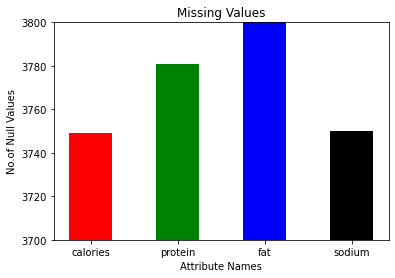

In [15]:
k1=list(greater_than_zero_null.keys())
v1=list(greater_than_zero_null.values())
plt.bar(k1,v1,color="rgbk",width=0.5)
plt.ylim(min(v1).round(-2),max(v1).round(-2))
plt.xlabel("Attribute Names")
plt.ylabel("No.of Null Values")
plt.title("Missing Values")

# Filling Null values in Continuous Data

In [16]:
data=data.interpolate()

In [17]:
for i in range(len(cols)):
    temp=(data[cols[i]].isnull().sum())
    print("Column name is {} and number or null values are {}".format(cols[i],temp))
   

Column name is rating and number or null values are 0
Column name is calories and number or null values are 0
Column name is protein and number or null values are 0
Column name is fat and number or null values are 0
Column name is sodium and number or null values are 0
Column name is #cakeweek and number or null values are 0
Column name is #wasteless and number or null values are 0
Column name is 22-minute meals and number or null values are 0
Column name is 3-ingredient recipes and number or null values are 0
Column name is 30 days of groceries and number or null values are 0
Column name is advance prep required and number or null values are 0
Column name is alabama and number or null values are 0
Column name is alaska and number or null values are 0
Column name is alcoholic and number or null values are 0
Column name is almond and number or null values are 0
Column name is amaretto and number or null values are 0
Column name is anchovy and number or null values are 0
Column name is a

Column name is granola and number or null values are 0
Column name is grape and number or null values are 0
Column name is grapefruit and number or null values are 0
Column name is grappa and number or null values are 0
Column name is green bean and number or null values are 0
Column name is green onion/scallion and number or null values are 0
Column name is grill and number or null values are 0
Column name is grill/barbecue and number or null values are 0
Column name is ground beef and number or null values are 0
Column name is ground lamb and number or null values are 0
Column name is guam and number or null values are 0
Column name is guava and number or null values are 0
Column name is haiti and number or null values are 0
Column name is halibut and number or null values are 0
Column name is halloween and number or null values are 0
Column name is ham and number or null values are 0
Column name is hamburger and number or null values are 0
Column name is hanukkah and number or null 

Column name is side and number or null values are 0
Column name is simmer and number or null values are 0
Column name is skewer and number or null values are 0
Column name is slow cooker and number or null values are 0
Column name is smoker and number or null values are 0
Column name is smoothie and number or null values are 0
Column name is snapper and number or null values are 0
Column name is sorbet and number or null values are 0
Column name is soufflé/meringue and number or null values are 0
Column name is soup/stew and number or null values are 0
Column name is sour cream and number or null values are 0
Column name is sourdough and number or null values are 0
Column name is south carolina and number or null values are 0
Column name is soy and number or null values are 0
Column name is soy free and number or null values are 0
Column name is soy sauce and number or null values are 0
Column name is spain and number or null values are 0
Column name is sparkling wine and number or nul

In [18]:
data

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent
20050,4.375,631.0,45.0,24.0,517.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent


# Removing Outliers in each column

In [19]:
data

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent
20050,4.375,631.0,45.0,24.0,517.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent


In [20]:
temp_dict={}
data_after_out=data
con_cols=continuos_columns[1:]
for i in con_cols:
    q1=data_after_out[i].describe()['25%']
    q3=data_after_out[i].describe()['75%']
    iqr=q3-q1
    temp_dict[i]=[q1,q3,iqr]


In [21]:
for i in list(temp_dict.keys()):
    q1=temp_dict[i][0]
    q3=temp_dict[i][1]
    iqr=temp_dict[i][2]
    data_after_out=data_after_out[(q1-1.5*iqr)<=data_after_out[i]]
    data_after_out=data_after_out[data_after_out[i]<=q3+1.5*iqr]
    print("Length after each outlier is removed from columns is",len(data_after_out))

Length after each outlier is removed from columns is 17102
Length after each outlier is removed from columns is 16588
Length after each outlier is removed from columns is 16333
Length after each outlier is removed from columns is 15689


In [22]:
print("Number of outliers is {} ".format(len(data)-len(data_after_out)))

Number of outliers is 2562 


# Data after Removing outliers

In [23]:
data_after_out

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20044,3.750,84.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent


In [24]:
data_after_out.describe()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
count,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,...,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000
mean,3.690723,363.851338,13.542774,19.547628,381.401633,0.000255,0.000064,0.000637,0.001466,0.000255,...,0.001530,0.028173,0.000064,0.000319,0.016253,0.000127,0.000382,0.001657,0.001084,0.015998
std,1.349990,217.076482,14.043926,15.352425,374.651559,0.015966,0.007984,0.025239,0.038261,0.015966,...,0.039083,0.165471,0.007984,0.017850,0.126453,0.011290,0.019553,0.040676,0.032901,0.125473
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,202.000000,3.000000,8.000000,84.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.375000,315.500000,8.000000,16.000000,260.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.375000,496.500000,20.000000,28.000000,574.500000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,1168.000000,64.000000,71.333333,1682.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [25]:
dis_scatter(data_after_out,con_cols)

# Finding Correlation between Cotinuous Variables

In [26]:
correlations=data_after_out[con_cols].corr()

<AxesSubplot:>

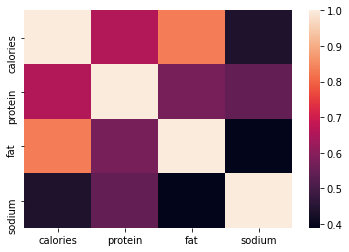

In [27]:
sns.heatmap(correlations)

In [28]:
correlations

,calories,protein,fat,sodium
calories,1.000000,0.656935,0.835042,0.437157
protein,0.656935,1.000000,0.573694,0.545664
fat,0.835042,0.573694,1.000000,0.389348
sodium,0.437157,0.545664,0.389348,1.000000


# Standarizing values

In [29]:
x=data_after_out[con_cols]
x=DataFrame(StandardScaler().fit_transform(x),columns=con_cols)
x["Rating_Labels"]=Series(list(data_after_out["Rating_Labels"]))
x.describe()

,calories,protein,fat,sodium
count,1.568900e+04,1.568900e+04,1.568900e+04,1.568900e+04
mean,-1.066703e-16,-1.900449e-16,-6.531202e-17,2.592525e-16
std,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00
min,-1.676197e+00,-9.643462e-01,-1.273301e+00,-1.018049e+00
25%,-7.456197e-01,-7.507239e-01,-7.521936e-01,-7.938339e-01
50%,-2.227458e-01,-3.946867e-01,-2.310867e-01,-3.240491e-01
75%,6.110883e-01,4.598025e-01,5.505737e-01,5.154243e-01
max,3.704567e+00,3.592929e+00,3.373236e+00,3.471599e+00


In [30]:
dis_scatter(x,con_cols)

# Principal Component Analysis

In [31]:
pca=PCA(n_components=3)

In [32]:
principalComponents = pca.fit_transform(x[list(x.columns)[:-1]])

In [33]:
x1=DataFrame(principalComponents,columns=['PCA_1','PCA_2','PCA_3'])
x1.describe()

,PCA_1,PCA_2,PCA_3
count,1.568900e+04,1.568900e+04,1.568900e+04
mean,-2.667536e-16,-2.771489e-17,1.354431e-17
std,1.655351e+00,8.477410e-01,6.207005e-01
min,-2.491225e+00,-3.157244e+00,-3.200147e+00
25%,-1.297447e+00,-4.604791e-01,-3.318955e-01
50%,-3.649234e-01,-6.780452e-02,5.023495e-03
75%,1.053346e+00,3.850702e-01,2.394431e-01
max,6.527081e+00,3.775894e+00,3.874414e+00


In [34]:
list_sum_of_cat=[]
for i in range(len(x)):
    temp=data_after_out[categorical_columns[:-1]].iloc[i].sum()
    #print("i is {} and sum is {}".format(i,temp))
    list_sum_of_cat.append(temp)
#list_sum_of_cat

In [35]:
x1["Combination_of_Categorical"]=list_sum_of_cat

In [36]:
x1["Rating_Labels"]=Series(list(x["Rating_Labels"]))

In [37]:
dis_scatter(x1,['PCA_1','PCA_2','PCA_3'])

In [38]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels
0,0.520938,0.869622,0.999955,11.0,Average
1,1.544166,2.149168,-1.071377,11.0,Excellent
2,-1.438811,0.126362,0.189947,7.0,Good
3,-0.121454,-0.148576,0.058633,17.0,Excellent
4,1.195903,-0.423513,-0.072681,11.0,Good
...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good
15685,-2.209771,0.225393,0.255598,8.0,Good
15686,1.588795,-0.201107,-0.088135,16.0,Excellent
15687,2.058850,-0.049200,0.201169,15.0,Excellent


In [39]:
x1["Combination_of_Categorical"].isnull().sum()

0

In [40]:
x1["rating"]=list(Series(data_after_out["rating"]))

In [41]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels,rating
0,0.520938,0.869622,0.999955,11.0,Average,2.500
1,1.544166,2.149168,-1.071377,11.0,Excellent,4.375
2,-1.438811,0.126362,0.189947,7.0,Good,3.750
3,-0.121454,-0.148576,0.058633,17.0,Excellent,5.000
4,1.195903,-0.423513,-0.072681,11.0,Good,3.125
...,...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good,3.750
15685,-2.209771,0.225393,0.255598,8.0,Good,3.125
15686,1.588795,-0.201107,-0.088135,16.0,Excellent,4.375
15687,2.058850,-0.049200,0.201169,15.0,Excellent,4.375


# Insight based on Vizualization Techniques

In [42]:
grouped_data=x1.groupby("Rating_Labels").count()

In [43]:
height=list(grouped_data["PCA_1"])
temp_dict2=DataFrame(grouped_data["rating"]).to_dict()
labels=list(temp_dict2['rating'].keys())
values=list(temp_dict2['rating'].values())
print(labels,values)

['Average', 'Bad', 'Excellent', 'Good', 'Very Bad'] [432, 224, 8260, 5294, 1479]


In [44]:
px.bar(x=labels,y=values,color=labels)




In [45]:
px.histogram(x=x1["PCA_1"])

In [46]:
px.histogram(x=x1["PCA_2"])

In [47]:
px.histogram(x=x1["PCA_3"])

In [48]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels,rating
0,0.520938,0.869622,0.999955,11.0,Average,2.500
1,1.544166,2.149168,-1.071377,11.0,Excellent,4.375
2,-1.438811,0.126362,0.189947,7.0,Good,3.750
3,-0.121454,-0.148576,0.058633,17.0,Excellent,5.000
4,1.195903,-0.423513,-0.072681,11.0,Good,3.125
...,...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good,3.750
15685,-2.209771,0.225393,0.255598,8.0,Good,3.125
15686,1.588795,-0.201107,-0.088135,16.0,Excellent,4.375
15687,2.058850,-0.049200,0.201169,15.0,Excellent,4.375


In [49]:
Cate_Sum=Series(list_sum_of_cat)
ratingnew=Series(list(data_after_out["rating"]))
calnew=Series(list(data_after_out["calories"]))
pronew=Series(list(data_after_out["protein"]))
fatnew=Series(list(data_after_out["fat"]))
sodiumnew=Series(list(data_after_out["sodium"]))
data_after_out_final=DataFrame()

In [50]:
data_after_out_final["Calorie"]=calnew
data_after_out_final["Protein"]=pronew
data_after_out_final["Fat"]=fatnew
data_after_out_final["Sodium"]=sodiumnew
data_after_out_final["Ratings"]=ratingnew
data_after_out_final["Combination_of_Categorical"]=Cate_Sum

In [51]:
data_after_out_final

,Calorie,Protein,Fat,Sodium,Ratings,Combination_of_Categorical
0,426.0,30.0,7.0,559.0,2.500,11.0
1,403.0,18.0,23.0,1439.0,4.375,11.0
2,165.0,6.0,7.0,165.0,3.750,7.0
3,356.0,13.0,19.5,308.5,5.000,17.0
4,547.0,20.0,32.0,452.0,3.125,11.0
...,...,...,...,...,...,...
15684,84.0,0.0,0.0,5.0,3.750,9.0
15685,28.0,2.0,2.0,64.0,3.125,8.0
15686,671.0,22.0,28.0,583.0,4.375,16.0
15687,563.0,31.0,38.0,652.0,4.375,15.0
